In [1]:
#impory packages
import json
import numpy as np
import csv
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
with open("Recipes 2018-07-24 (all AF, production).json", encoding="utf-8") as d:
    df = json.load(d)

In [4]:
#import functions, class
from recipe import recipe
from renew import renew
from time import time

## Transfer dataset into suitable format

In [5]:
#read recipes from json files using 'renew'
df_new = [ renew(x) for x in df["recipes"] ]

In [6]:
#extract difficulty indices, ingr_name, main_ingr, seasoning from each recipes using class 'recipe'
for x in df_new:
    r = recipe(x)
    x["ingr_diff"] = r.ingr_diff()
    x["time_diff"] = r.time_diff()
    x["step_diff"] = r.step_diff()
    x["overall_diff"] = r.overall_diff()
    x["ingr_name"] = sorted(r.get_ingr_name(),key=str.lower)
    x["main_ingr"] = sorted(list(r.get_main_ingr().keys()),key=str.lower)
    x["other_ingr"] = sorted(list(r.get_other_ingr().keys()),key=str.lower)
    x["seasoning_ingr"] = sorted(list(r.get_seasoning_ingr().keys()),key=str.lower)

In [5]:
#write into new csv file
keys = df_new[0].keys()
with open("df_new.csv", "w+", newline="", encoding="utf8") as out:
    dict_writer = csv.DictWriter(out, keys)
    dict_writer.writeheader()
    dict_writer.writerows(df_new)

## Create matrix for clustering

In [7]:
r = [ recipe(x) for x in df_new ]

In [8]:
#create similarity matrix based on seasonings in recipes(no word2vec)
tic = time()
matrix_seasoning = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_seasoning[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_seasoning[i][j] = r[i].seasoning_sim(r[j])
        matrix_seasoning[j][i] = matrix_seasoning[i][j]
toc = time()
print("%fs elasped" % (toc - tic))#record time needed

17.748566s elasped


In [9]:
#based on main ingredients(no word2vec)
tic = time()
matrix_main = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_main[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_main[i][j] = r[i].main_sim(r[j])
        matrix_main[j][i] = matrix_main[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

18.945288s elasped


In [9]:
#based on flavor(no word2vec)
tic = time()
matrix_flavor = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_flavor[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_flavor[i][j] = r[i].flavor_sim(r[j])
        matrix_flavor[j][i] = matrix_flavor[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

74.149548s elasped


In [10]:
#based on all ingredients(no word2vec)
tic = time()
matrix_overall = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_overall[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_overall[i][j] = r[i].overall_sim(r[j])
        matrix_overall[j][i] = matrix_overall[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

11.739529s elasped


### overall slow matrix may take 10 mins to output

In [11]:
#create similarity matrix based on seasonings in recipes, leverage word2vec
tic = time()
matrix_seasoning_slow=np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_seasoning_slow[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_seasoning_slow[i][j] = r[i].seasoning_sim(r[j], isFast=False)
        matrix_seasoning_slow[j][i] = matrix_seasoning_slow[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

20.658886s elasped


In [12]:
tic = time()
matrix_main_slow = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_main_slow[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_main_slow[i][j] = r[i].main_sim(r[j], isFast=False)
        matrix_main_slow[j][i] = matrix_main_slow[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

30.254009s elasped


In [13]:
tic = time()
matrix_flavor_slow = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_flavor_slow[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_flavor_slow[i][j] = r[i].flavor_sim(r[j], isFast=False)
        matrix_flavor_slow[j][i] = matrix_flavor_slow[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

389.459932s elasped


In [14]:
tic = time()
matrix_overall_slow = np.zeros(shape=(len(r),len(r)))
for i in range(len(r)):
    matrix_overall_slow[i][i] = 1
    for j in range(i+1, len(r)):
        matrix_overall_slow[i][j] = r[i].overall_sim(r[j], isFast=False)
        matrix_overall_slow[j][i] = matrix_overall_slow[i][j]
toc = time()
print("%fs elasped" % (toc - tic))

431.202832s elasped


# Clsutering using above matrices

## Infomap clustering

In [7]:
import igraph as ig
from igraph import *

In [16]:
#extract recipe title and id
titles = [ r["title"] + ":" + r["short_content_id"] for r in df["recipes"] ]
w_mat = matrix_flavor_slow

In [17]:
#equal weight to each recipe
weighted_graph = Graph.Full(len(titles))
weighted_graph.es["weight"] = 1
weighted_graph.vs["name"] = titles
for i in range(len(titles)):
    for j in range(i+1, len(titles)):
        weighted_graph[i, j] = w_mat[i, j]

In [18]:
#infomap clustering
sgs = weighted_graph.community_infomap(edge_weights="weight").subgraphs()

In [19]:
#print clutering result: not very good 
for g, m in zip(sgs, range(len(sgs))):
    names = g.vs["name"]
    print("#%d: %s" % (m+1, names))

#1: ['Fish lasagna with beets:MR-931538C8', 'Honey & Lemon roasted chicken:MR-A750E68D', 'Spring Rolls:MR-2942CCA5', 'Spicy chicken drumsticks:MR-6D966ECC', 'Italian Style Lobster:MR-BDE5A10A', 'Roasted pumpkin seeds:MR-9D23D6CA', 'Fried Prawns:MR-F3762FC9', 'Chicken and bell pepper kebab with couscous:MR-74E36426', 'Bruschetta:MR-DF60E09C', 'Fried hot prawns:MR-F120D18B', 'Crispy Potato Skin Wedges:MR-E62EFA82', 'Roasted stuffed Radicchio:MR-FDCE0D81', 'Beef Meatballs:MR-5F4074E4', 'Gorgonzola Apple Pizza:MR-A5F72C98', 'Baked Apples Filled with Dates and Chestnuts:MR-12CDE58C', 'Pizza dough:MR-E8011754', 'Grilled golden corn cobs:MR-E9944637', 'Baked mini spinach quiches:MR-917C86AE', 'Banana bread:MR-9E70A360', 'Savory spiced carrot cake:MR-0E255000', 'Spicy Farmhouse Bread:MR-82D3C3F4', 'Aalu Samosa:MR-436C9026', 'Potatoes au Gratin:MR-4B27F316', 'Wax Apple and Celery:MR-DE0A0BEE', 'Salmon Roll :MR-42EF2F27', 'Yoghurt dip:MR-970BDE3A', '[undefAm, undefUnit]Apricot blackberry crumble

## Affinity propagation

In [63]:
from sklearn.cluster import AffinityPropagation

In [21]:
w_mat = matrix_flavor_slow

In [22]:
af = AffinityPropagation(affinity="precomputed", verbose=True).fit(w_mat)

Converged after 65 iterations.


In [23]:
grouped = [ [ titles[i] for i, v in enumerate(list(af.labels_)) if v == l ] for l in set(af.labels_) ]

In [24]:
#print out clustering result
for i, g in enumerate(grouped):
    print("#%d: %s" % (i, g))

#0: ['Airfried chicken :UR-2E35261F']
#1: ['Roasted pumpkin seeds:MR-9D23D6CA', 'Roasted pumpkin seeds:MR-35B84ECF', 'Crispy potato skin wedges:MR-F6DA7FE3', 'Spelt rolls:MR-FA35B5F2', 'Croutons :MR-5DEAC118', 'Black burger buns:MR-3F894D66', 'Gluten free fiber bread:MR-DE3C5EC6', 'Popped pumpkin seeds:MR-F74D55D4', 'Crown of Lamb:MR-E7CCDC64']
#2: ['Test, delete it after testing :MR-51FAA24B']
#3: ['Potatoes au Gratin:MR-4B27F316', 'Salmon filet:MR-0E290DF2', 'Chocolate fondue with fruit:MR-8C9DAD63', 'Curry chicken skewers:MR-F63BE839', 'Lasagna with salmon and broccoli:MR-097A09D6', 'Salmon lasagne:MR-BDF87ECD']
#4: ['Roasted stuffed Radicchio:MR-FDCE0D81', 'Beef Meatballs:MR-5F4074E4', 'Wax Apple and Celery:MR-DE0A0BEE', 'Salmon Roll :MR-42EF2F27', 'Hasselback sweet potatoes with guacamole:MR-3BA8C1B5', 'Stuffed Red Onions:MR-E6F78CDE', 'Korean BBQ Satay:MR-C968A369', 'Mutton ribs au gratin:MR-D13A5C58', 'Teriyaki chicken with rice and spring onions:MR-E4F381C8', '[numbStep]Mutton 

In [60]:
def get_ap_labels(w_mat):
    af = AffinityPropagation(affinity="precomputed", verbose=True).fit(w_mat)
    return af.labels_

In [61]:
def get_ap_labels_2(w_mat):
    af = AffinityPropagation(affinity="precomputed", verbose=True,damping=0.9,max_iter=2000).fit(w_mat)
    return af.labels_

In [19]:
df_new=pd.read_csv("df_new.csv",index_col=0)

In [28]:
#add labels from clustering to csv file
df_new["AP_main"] = get_ap_labels_2(matrix_main)

Converged after 392 iterations.


In [29]:
df_new["AP_main_slow"] = get_ap_labels(matrix_main_slow)

Converged after 71 iterations.


In [30]:
df_new["AP_seasoning"] = get_ap_labels_2(matrix_seasoning)

Converged after 234 iterations.


In [31]:
df_new["AP_seasoning_slow"] = get_ap_labels_2(matrix_seasoning_slow)

Converged after 143 iterations.


In [32]:
df_new["AP_flavor"] = get_ap_labels_2(matrix_flavor)

Converged after 176 iterations.


In [33]:
df_new["AP_flavor_slow"] = get_ap_labels_2(matrix_flavor_slow)

Converged after 283 iterations.


In [34]:
df_new["AP_overall"] = get_ap_labels(matrix_overall)

Converged after 80 iterations.


In [35]:
df_new["AP_overall_slow"] = get_ap_labels(matrix_overall_slow)

Converged after 75 iterations.


In [37]:
#organize all the matrix to one excel file
from xlsxwriter.workbook import Workbook
header=df_new["title"]+","+df_new["short_content_id"]
df1=pd.DataFrame(matrix_main,index=header,columns=header)
df2=pd.DataFrame(matrix_seasoning,index=header,columns=header)
df3=pd.DataFrame(matrix_flavor,index=header,columns=header)
df4=pd.DataFrame(matrix_overall,index=header,columns=header)
df5=pd.DataFrame(matrix_main_slow,index=header,columns=header)
df6=pd.DataFrame(matrix_seasoning_slow,index=header,columns=header)
df7=pd.DataFrame(matrix_flavor_slow,index=header,columns=header)
df8=pd.DataFrame(matrix_overall_slow,index=header,columns=header)
with pd.ExcelWriter("df_new.xlsx", engine="xlsxwriter") as writer:
    df_new.to_excel(writer,"recipes")
    df1.to_excel(writer, "matrix_main")
    df2.to_excel(writer, "matrix_seasoning")
    df3.to_excel(writer, "matrix_flavor")
    df4.to_excel(writer, "matrix_overall")  
    df5.to_excel(writer, "matrix_main_slow")  
    df6.to_excel(writer, "matrix_seasoning_slow")  
    df7.to_excel(writer, "matrix_flavor_slow")  
    df8.to_excel(writer, "matrix_overall_slow")  
    writer.save()    

In [44]:
#Read back matrix if necessary
df_temp = pd.read_excel('df_new.xlsx', 'matrix_seasoning_slow',index_col=0)
matrix_seasoning_slow=np.matrix(df_temp)

## Heat Map to compare clustering perfomance

In [57]:
colors=["red","black","green","purple","yellow","blue"]

In [58]:
#grp_size is the size of the plot
#col_size is the size of matrix to be plotted
def plot_cluster(m,ind,col_size,grp_size=10):
    ind_sort=np.argsort(ind)
    m=m[:,ind_sort]
    m=m[ind_sort,:]
    fig, ax = plt.subplots(figsize=(grp_size, grp_size))
    cax = ax.matshow(m[0:col_size,0:col_size], cmap='coolwarm')
    l=[]
    # 6 colors in a loop
    #label each recipe in a cluster with same color
    for i in range(min(ind),max(ind)+1):
        l+=[colors[i%6-1]]*np.count_nonzero(ind == i)
    ax.set_xticks(range(col_size))
    ax.set_yticks(range(col_size))
    ll=[str(i) for i in ind_sort]
    ax.set_xticklabels(ll[0:col_size])
    ax.set_yticklabels(ll[0:col_size])
    for color,tick in zip(l,ax.xaxis.get_major_ticks()):
        tick.label2.set_color(color)
    for color,tick in zip(l,ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    cbar = fig.colorbar(cax, ticks=[-1, 0, 1], aspect=40, shrink=.8)

### Hierarchical Clustering

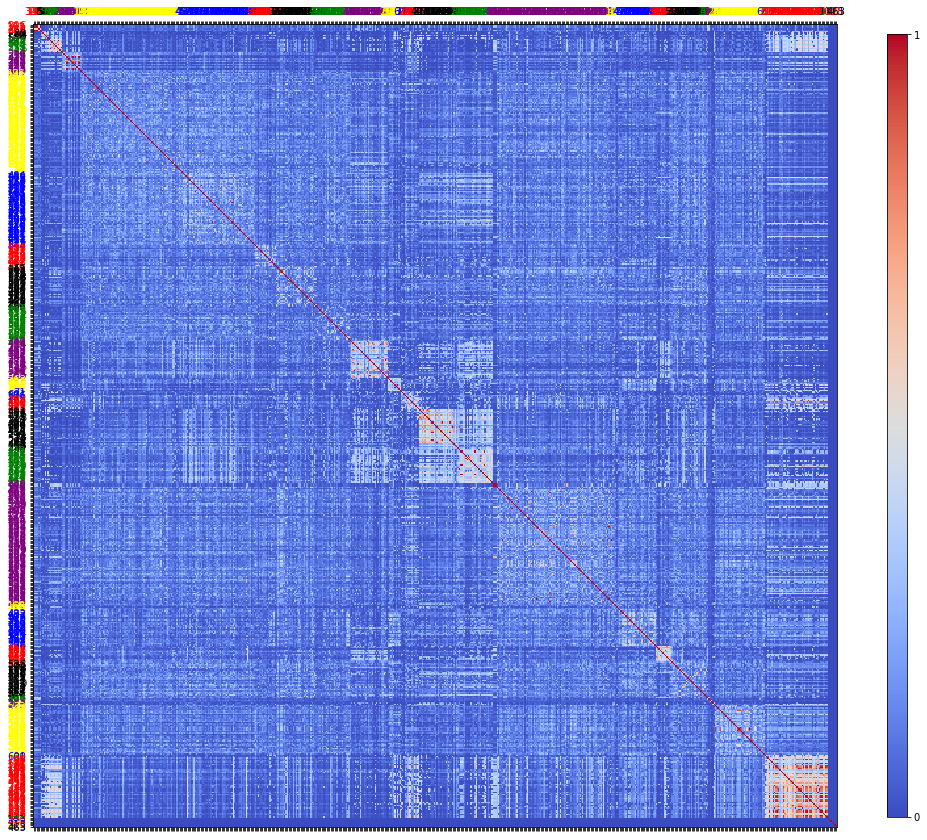

In [187]:
import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as ssd
X = 1-matrix_overall_slow
#change symmetric distance matrix to distance vector
d=ssd.squareform(X)
L = sch.linkage(d, method="complete")
ind = sch.fcluster(L, 0.99*d.max(),"distance")
plot_cluster(matrix_overall_slow,ind,col_size=len(ind),grp_size=18)
#x,y-axis color represent the clusters
#the color inside the heatmap represents the similarity score
#we need to oberserve the similarity score/color around the diagonal
#if the contrast of points around the diagonal and , the the clustering method is better

In [188]:
print(max(ind),min(ind))#number of clusters 32

32 1


### Affinity Propagation

Converged after 72 iterations.


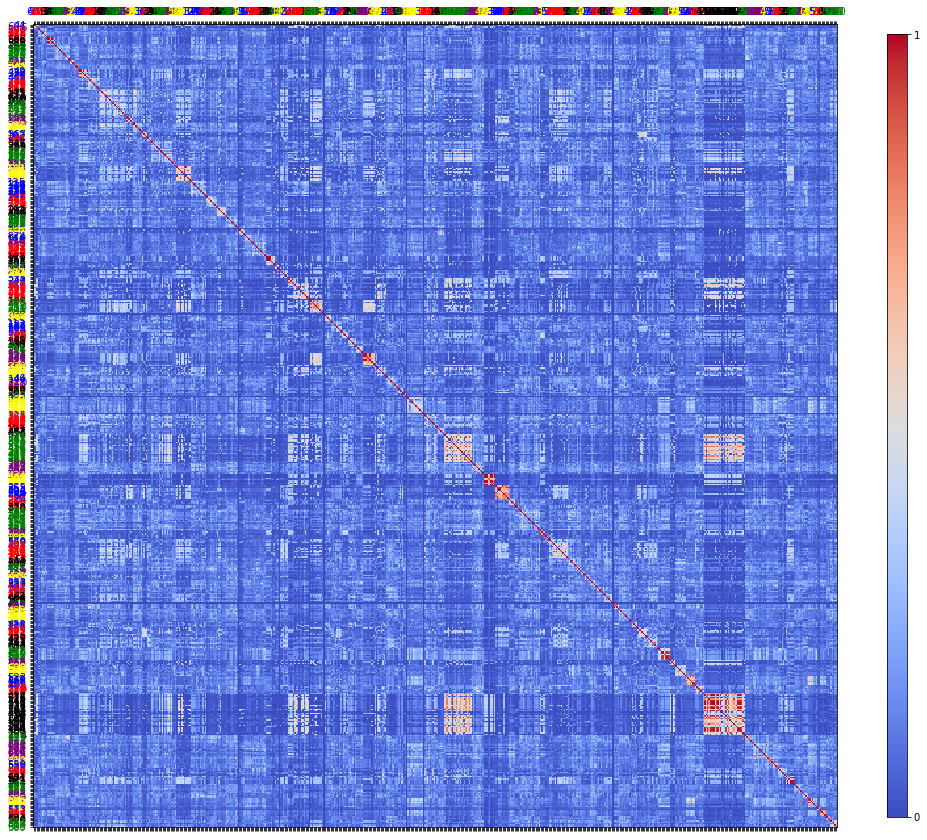

In [64]:
ind_2=get_ap_labels(matrix_overall_slow)
plot_cluster(matrix_overall_slow,ind_2,col_size=len(ind_2),grp_size=18)

In [65]:
print(max(ind_2),min(ind_2)) #number of cluters 94

93 0


### DBSCAN

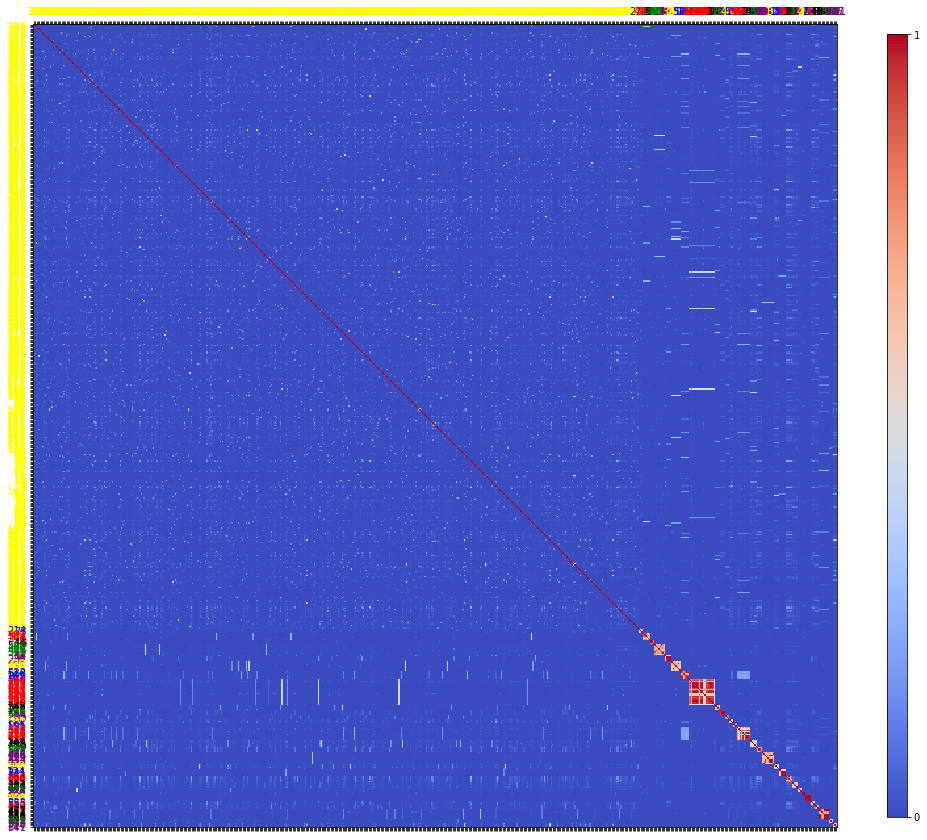

In [46]:
from sklearn.cluster import DBSCAN
ind_3=DBSCAN(metric="precomputed",min_samples=3).fit_predict(1-matrix_overall)
plot_cluster(matrix_overall,ind_3,col_size=len(ind_3),grp_size=18)

In [47]:
print(max(ind_3),min(ind_3))

28 -1


### HDBSCAN

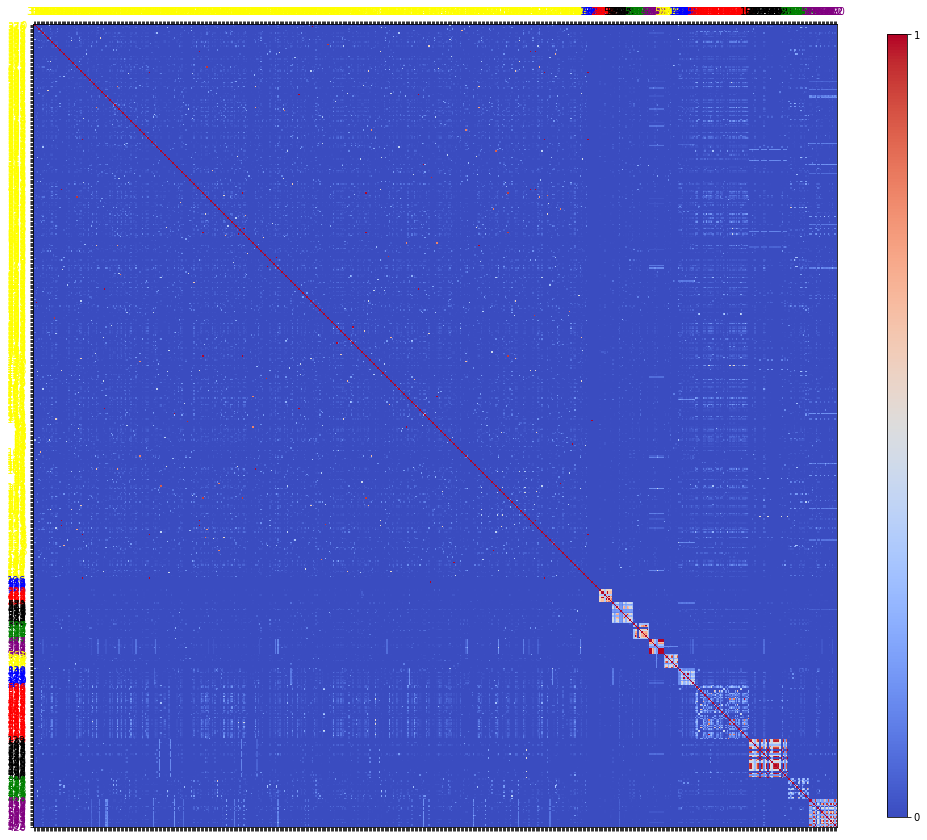

In [48]:
import hdbscan
ind_4=hdbscan.HDBSCAN(min_cluster_size=7,gen_min_span_tree=True,metric="precomputed").fit_predict(1-matrix_overall)
plot_cluster(matrix_overall,ind_4,col_size=len(ind_4),grp_size=18)

In [50]:
print(max(ind_4),min(ind_4))

10 -1


In [45]:
# use this function, we can find the n most similar recipes given the algorithm you want to use
title=df_new["title"]
def most_similar_recipe(recipe_id,n, method="overall",is_Fast=True):
    if method == "overall":
        if is_Fast:
            ind = np.array(np.argsort(-matrix_overall[recipe_id]))[0][:n]
        else:
            ind = np.array(np.argsort(-matrix_overall_slow[recipe_id]))[0][:n]
    if method == "main":
        if is_Fast:
            ind = np.array(np.argsort(-matrix_main[recipe_id]))[0][:n]
        else:
            ind = np.array(np.argsort(-matrix_main_slow[recipe_id]))[0][:n]
    if method == "flavor":
        if is_Fast:
             ind = np.array(np.argsort(-matrix_flavor[recipe_id]))[0][:n]
        else:
            ind = np.array(np.argsort(-matrix_flavor_slow[recipe_id]))[0][:n]
    if method == "seasoning":
        if is_Fast:
             ind = np.array(np.argsort(-matrix_seasoning[recipe_id]))[0][:n]
        else:
            ind = np.array(np.argsort(-matrix_seasoning_slow[recipe_id]))[0][:n]
    a = [title[i] for i in ind]
    b = title[recipe_id]
    return [re for re in a if re not in b]

In [56]:
r[1].get_ingr_name()

['lemon',
 'apricot, dried',
 'thyme, fresh',
 'chicken',
 'green courgette / zucchini',
 'yellow courgette / zucchini',
 'honey',
 'salt',
 'olive oil',
 'apple',
 'pepper',
 'red onion',
 'green garlic']

In [35]:
most_similar_recipe(1,10,'overall')

['Honey mustard chicken',
 'Orange & paprika chicken ',
 'Rice Pudding with Apple',
 'Verdure al forno with anchovy',
 'Muesli bars',
 'Lemon Muffin Cakes ',
 'Lemon Muffin Cakes',
 'Airfryer Fish tikka masala',
 'Norwegian Apple Pie']

In [36]:
most_similar_recipe(1,10,'overall',False)

['Honey mustard chicken',
 'Chicken drumettes',
 'Orange & paprika chicken ',
 'Chicken with Riesling and elderberry',
 'Fried Spicy Thai Chicken Wings',
 'Chicken drumsticks in a honey/orange marinade ',
 'Korean Fried Chicken',
 'Spicy Wings',
 'Spicy drumsticks']

In [39]:
most_similar_recipe(1,10,'flavor')

['Honey mustard chicken',
 'Chicken with Riesling and elderberry',
 'Chicken drumsticks in a honey/orange marinade ',
 'Chicken and bell pepper kebab with couscous',
 'Baba ganoush',
 'Fried Pineapple',
 'Steak shoarma with paprika sauce',
 'Salmon with fennel',
 'Roasted winter vegetables']

In [38]:
most_similar_recipe(1,10,'flavor',False)

['Honey mustard chicken',
 'Potato and chicken salad with spring vegetables',
 'Stuffed pumpkin with spinach and goat cheese',
 'Grilled Caesar salad with chicken',
 'Grilled Caesar salad with chicken',
 'Stuffed Portobello with roasted radicchio',
 'Chicken with Riesling and elderberry',
 'Carrots glazed with thyme honey',
 'Salmon with fennel']

In [40]:
most_similar_recipe(1,10,'main')

['Honey mustard chicken',
 'Orange & paprika chicken ',
 'Fish lasagna with beets',
 'Roast Beef with vegetables',
 'Baked Dumplings',
 'Chocolate Mug Cakes',
 'Bacon Wrapped Prawns',
 'Pumpkin ovencheese gratin',
 'Breaded button mushrooms with rocket and tomato salad']

In [41]:
most_similar_recipe(1,10,'main',False)

['Honey mustard chicken',
 'Orange & paprika chicken ',
 'Chicken drumsticks in a honey/orange marinade ',
 'Chicken drumettes',
 'Chicken with Riesling and elderberry',
 'Fried Spicy Thai Chicken Wings',
 'Curry chicken skewers',
 'Korean Fried Chicken',
 'Chicken Nuggets']

In [46]:
most_similar_recipe(1,10,'seasoning')

['Spanish chicken with potato and parsnip crisps',
 'Savoy Cabbage Roulade with Veal Filling',
 'Colorful Vegetable Strudel',
 'Honey mustard chicken',
 'Winter salad with salmon and lentils',
 'Baked belly pork slices with parsley potatoes ',
 'Lasagna with salmon and broccoli',
 'Quiche Lorraine',
 'Meat kebabs with lecsó']

In [47]:
most_similar_recipe(1,10,'seasoning',False)

['Spanish chicken with potato and parsnip crisps',
 'Savoy Cabbage Roulade with Veal Filling',
 'Colorful Vegetable Strudel',
 'Honey mustard chicken',
 'Winter salad with salmon and lentils',
 'Baked belly pork slices with parsley potatoes ',
 'Lasagna with salmon and broccoli',
 'Quiche Lorraine',
 'Meat kebabs with lecsó']

## Futher Try-out to see how ingredients connect to each other

In [67]:
ingr_lists=[r[i].get_ingr_name() for i in range(len(df_new))]

In [68]:
ingr_freq = {}

for ingr_list in ingr_lists:
    for ingr in ingr_list:
        ingr=ingr.lower()
        if ingr not in ingr_freq.keys():
            ingr_freq[ingr] = 0
        ingr_freq[ingr] += 1

ingr_p = { k : v / len(df_new) for k, v in ingr_freq.items() }

In [69]:
ingr_mutual_freq={}

for ingr_list in ingr_lists:
    for i in range(len(ingr_list)-1):
        for j in range(i+1,len(ingr_list)):
            comb=tuple(sorted((ingr_list[i],ingr_list[j])))
            if not comb in ingr_mutual_freq.keys():
                ingr_mutual_freq[comb] = 0
            ingr_mutual_freq[comb] += 1
            
ingr_mutual_p = { k : v / len(df_new) for k, v in ingr_mutual_freq.items() }

In [70]:
#calculate prob of each ingredient/pair of ingredients show in one recipe
ingr_list=sorted(list(ingr_freq.keys()))
matrix_ingr = np.zeros(shape=(len(ingr_list), len(ingr_list)))

for i in range(len(ingr_list)):
    for j in range(len(ingr_list)):
        if i==j:
            matrix_ingr[i][j]=ingr_p[ingr_list[i]]
        else:
            comb=tuple(sorted((ingr_list[i],ingr_list[j])))
            if comb in ingr_mutual_p:
                matrix_ingr[i][j]=ingr_mutual_p[comb]
            else:
                matrix_ingr[i][j]=0 

In [71]:
#calculate information entropy for each ingredient/each pair of ingredients
ingr_list=sorted(list(ingr_freq.keys()))
len_ingr=len(ingr_list)
matrix_pmi = np.zeros(shape=(len_ingr, len_ingr))
#comb_list=[]
for i in range(len_ingr):
    for j in range(len_ingr):
        name1=ingr_list[i]
        name2=ingr_list[j]
        if i==j:
            matrix_pmi[i][j]=-np.log(ingr_p[name1])
        else:
            comb=tuple(sorted((name1,name2)))
            #comb_list.append(comb)
            if comb in ingr_mutual_p:
                matrix_pmi[i][j]=np.log(ingr_mutual_p[comb]/(ingr_p[name1]*ingr_p[name2]))
            else:
                matrix_pmi[i][j]=0 

In [72]:
median=np.median(matrix_pmi[matrix_pmi.nonzero()])
median
#quantile=np.percentile(matrix_pmi[matrix_pmi.nonzero()], 80)

1.85238409104449

In [31]:
#change self similarity into 0 to avoid influence in drawing graph
#create adjacency matrix
new_m=np.where(matrix_pmi>median,1,0)
g=ig.Graph.Adjacency(new_m.tolist(),mode=ADJ_LOWER)
plot(g)

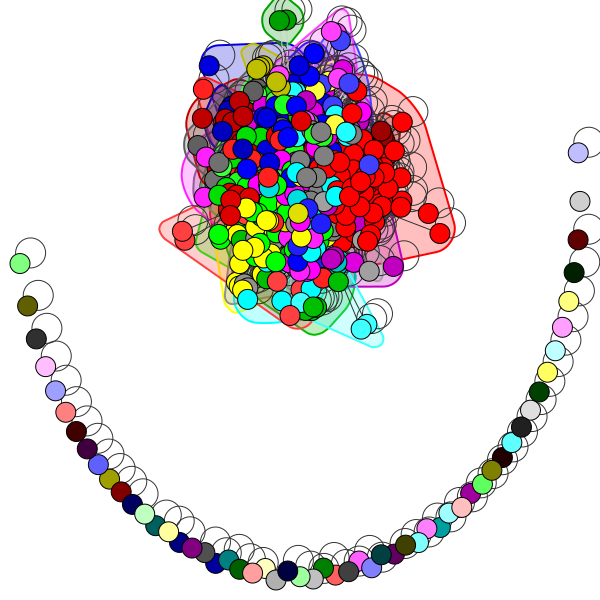

In [222]:
W=matrix_pmi[matrix_pmi>median]
# Add edge weights
g.es['weight'] = W
im=ig.Graph.community_infomap(g,edge_weights=None, vertex_weights=None, trials=10)
membership_im=im.membership
plot(im,mark_groups=True)

In [223]:
max(im.membership)

92

## Walktrap(random walk)

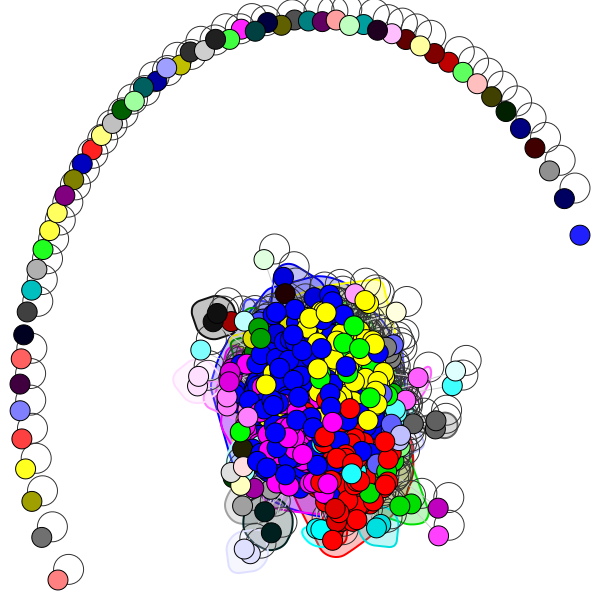

In [224]:
rw=ig.Graph.community_walktrap(g, weights=None, steps=4)
clusters = rw.as_clustering()
membership_rw = clusters.membership
plot(clusters,mark_groups=True)

In [225]:
labelled_ingr=pd.DataFrame(np.column_stack([ingr_list,membership_im,membership_rw]), columns=['Ingredients', 'membership_im','membership_rw'])
df_pmi=pd.DataFrame(matrix_pmi,index=ingr_list,columns=ingr_list)
df_ingr=pd.DataFrame(matrix_ingr,index=ingr_list,columns=ingr_list)

In [226]:
with pd.ExcelWriter("matrix_pmi.xlsx", engine="xlsxwriter") as writer:
    df_ingr.to_excel(writer,"matrix_prob")
    df_pmi.to_excel(writer,"matrix_pmi")
    labelled_ingr.to_excel(writer,"labelled_ingr")
    writer.save()

In [100]:
for i in range(len(matrix_sample)):
    for j in range(len(matrix_sample)):
        if matrix_sample[i][j]<median:
            matrix_sample[i][j]=0
        matrix_sample[i][i]=0

In [91]:
matrix_sample=matrix_pmi[70:200,70:200]

In [92]:
nodesize = [ingr_freq[k]*10 for k in sorted(ingr_freq.keys())][70:200]

In [101]:
loc=np.where(~np.array(matrix_sample).any(axis=1))[0]
matrix_sample_new = np.delete(matrix_sample, (loc), axis=0)
matrix_sample_new = np.delete(matrix_sample_new,(loc), axis=1)
ingr_list_new=list(np.delete(ingr_list[70:200], (loc)))
nodesize_new=list(np.delete(nodesize, (loc)))

In [102]:
len(nodesize_new)

104

In [103]:
import networkx as nx
G= nx.from_numpy_matrix(matrix_sample_new)
mapping = dict(zip(G, ingr_list_new))
G = nx.relabel_nodes(G, mapping)

In [88]:
#s = pd.Series(ingr_freq, name='nodesize')
#s.index.name = 'ingr'
#df_nodes=s.reset_index()
#df_nodes=df_nodes.sort_values('ingr')
#nodesize=df_nodes["nodesize"]

In [65]:
W=matrix_pmi_new[matrix_pmi_new.nonzero()]

In [77]:
#np.median(df_nodes["nodesize"])

2.0

In [81]:
freq= [0.1 if f < 2.0 else 1 for f in df_nodes["nodesize"]]
node_color=[(0.2, 0.4, 0.6, a) for a in freq]

In [101]:
#s = pd.Series(ingr_mutual_freq, name='linkfreq')
#df_edges=s.reset_index()

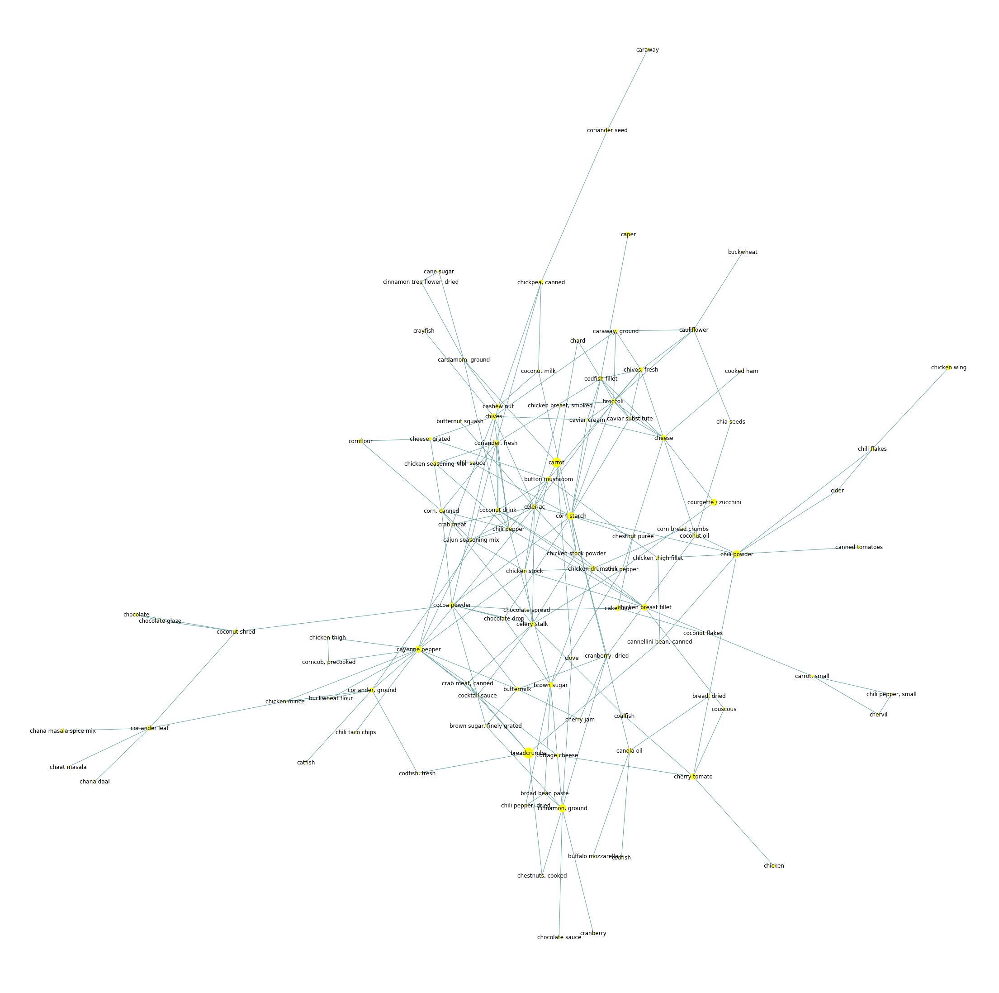

In [104]:
#if high mutual information entropy, then connect two ingredients
plt.figure(figsize=(30,30))
nx.draw(G, with_labels=True, pos = nx.spring_layout(G),node_size=nodesize_new,node_color="yellow",edge_color="cadetblue")

In [81]:
G=nx.Graph()
for index, row in df_edges.iterrows():
    G.add_edge(row['level_0'],row['level_1'],weight=row['linkfreq'])

In [82]:
elarge=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] >median]
esmall=[(u,v) for (u,v,d) in G.edges(data=True) if d['weight'] <median]

In [ ]:
pos=nx.spring_layout(G) # positions for all nodes
nx.draw_networkx_nodes(G,pos,node_size=700)

# edges
nx.draw_networkx_edges(G,pos,edgelist=elarge,
                    width=6)
nx.draw_networkx_edges(G,pos,edgelist=esmall,
                    width=6,alpha=0.5,edge_color='b',style='dashed')

# labels
nx.draw_networkx_labels(G,pos,font_size=20,font_family='sans-serif')

plt.axis('off')
plt.savefig("weighted_graph.png") # save as png
plt.show() # display

In [ ]:
for u,v,d in G.edges(data=True):
    d['weight'] = random.random()

edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

pos = nx.spring_layout(G)
nx.draw(G, pos, node_color='b', edgelist=edges, edge_color=weights, width=10.0, edge_cmap=plt.cm.Blues)
plt.savefig('edges.png')